# The Explainer Notebook

<h1 align="center">20 Years of Change: Voting Trends in Copenhagen’s National Elections</h1>

<div align="center">

Jasmin Thari (s204155), Johanne Franck () & Smilla Due ()

</div>


### Structure of this Notebook

This notebook consists of eight parts: [Motivation](#1), [Basic Statistics](#2), [Data Analysis](#3), [Genre](#4), [Visualizations](#5), [Discussion](#6), [Contributions](#7), and [References](#8).

In the first part, **Motivation**, we describe the project's goals and provide an overview of the dataset used.

In the second part, **Basic Statistics**, we give an overview of the dataset and its collection process. This section also includes a detailed explanation of the data cleaning procedures. Additionally, we present key dataset statistics and plots from our exploratory data analysis.

In the third part, **Data Analysis**, we describe our analytical approach and the insights derived from the data.

In the fourth part, **Genre**, we explain the genre chosen for our data story and outline the specific elements included in our data story.

In the fifth part, **Visualizations**, we present the visualizations created to support our data story. We explain the purpose of each visualization and how it contributes to the overall narrative.

In the sixth part, **Discussion**, we discuss the implications of our findings and how they relate to the broader context of voting trends in Copenhagen’s national elections. We also discuss the limitations of our analysis.

Finally, in the **Contributions** section, we detail the roles and responsibilities of each group member in the project.


### Table of Contents
1. [Motivation](#1)  
2. [Basic Statistics](#2)  
3. [Data Analysis](#3)  
4. [Genre](#4)  
5. [Visualizations](#5)  
6. [Discussion](#6)  
7. [Contributions](#7)  
8. [References](#8)

---


<a id="1"></a>
## 1.  Motivation

<!-- What is your dataset?
Why did you choose this/these particular dataset(s)?
What was your goal for the end user's experience? -->

### 1.1 Motivation and goal


### 1.2 Data

The data used in this study was obtained from **[Den Danske Valgdatabase](https://valgdatabase.dst.dk/)**, powered by *Danmarks Statistik*. This comprehensive database contains election data from Denmark spanning back to 1979. It includes data from various types of elections including:

- National parliamentary elections (*folketingsvalg*)  
- European Parliament elections (*europaparlamentsvalg*)  
- Referendums (*folkeafstemninger*)  
- Municipal and regional elections (*kommunalvalg* and *regionsrådsvalg*)  
- Parliamentary elections in Greenland and the Faroe Islands  

For the purpose of this project, we have chosen to focus specifically on **national elections in the Copenhagen constituency** over the past two decades. This includes the elections held in the years:  
**2001, 2005, 2007, 2011, 2015, and 2019** — resulting in a total of six elections.

The extracted election data includes:

- Total number of votes cast  
- Number of votes per political party across constituencies  

We filtered the dataset to include only constituencies within the **Copenhagen constituency (Københavns Storkreds)**. These constituencies are:

1. Østerbrokredsen  
2. Sundbyvesterkredsen  
3. Indre Bykredsen  
4. Sundbyøsterkredsen  
5. Nørrebrokredsen  
6. Bispebjergkredsen  
7. Brønshøjkredsen  
8. Valbykredsen  
9. Vesterbrokredsen  
10. Falkonerkredsen  
11. Slotskredsen  
12. Tårnbykredsen  

In addition to election data, **demographic and socioeconomic data** about the population of Copenhagen is also extracted. This supplementary data helps us better understand voting patterns in the context of population characteristics. The additional data categories include:

- **Demographic**: Gender, age, and ethnicity  
- **Socioeconomic**: Income, education level, and employment status  
- **Housing**: Type of housing, housing size, and housing prices  

In total, this resulted in **six `.csv` files**, which will be imported, cleaned, and explained in detail in the following sections.


**Libaries**

The libraries used for this project are presented and imported below.

In [43]:
import os
import json

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'iframe'
import folium

from bokeh.io import output_notebook, show, output_file, save
from bokeh.layouts import row as bokeh_row                 
from bokeh.models import ColumnDataSource, CheckboxGroup, CustomJS, Legend, LegendItem, HoverTool
from bokeh.models.ranges import FactorRange
from bokeh.plotting import figure
from bokeh.transform import dodge
from bokeh.io import curdoc
from bokeh.themes import Theme

# import checkbox


from IPython.display import display, clear_output

# Pandas settings
pd.set_option('future.no_silent_downcasting', True)

In [44]:
theme_colors = ['#FDFAE1', '#241B5F', '#FFB400', '#4A4DE9', '#FF5A00', '#FF6273', '#FF95A1', '#F3DCC6'] 

expanded_theme_colors = ['#241B5F', '#6A66B2','#FFB400', '#FFE299','#4A4DE9', '#A7AAFF', '#FF5A00', '#FF9D5C', '#FF6273', '#FFAAB2', '#FF95A1', '#FFD4DA', '#F3DCC6', '#EBD2BB']

wing_colors = {'Left': '#d52729', 'Right': '#00739b'}

const_colors = {
    'Østerbro': '#241B5F',   
    'Sundbyvester': '#FFB400',
    'Indre By': '#4A4DE9',   
    'Sundbyøster': '#FF5A00',
    'Nørrebro': '#FF6273',   
    'Bispebjerg': '#FF95A1',  
    'Brønshøj': '#FFE5B4',    
    'Valby': '#46237A',      
    'Vesterbro': '#D64161',   
    'Falkoner': '#FFC800',    
    'Slots': '#FF8427',      
    'Tårnby':  '#ABD2FA'       
}

party_colors = {
    'A.Socialdemokratiet': '#c9002c',       # Red
    'V.Venstre,DanmarksLiberaleParti': '#0066a1',  # Blue
    'B.DetRadikaleVenstre': '#EC008C',      # Purple
    'Ø.Enhedslisten-DeRød-Grønne': '#159F6B', # Green
    'F.SF-SocialistiskFolkeparti': '#C52E26',   # Magenta/Pink
    'C.DetKonservativeFolkeparti': '#00583C',   # Green
    'O.DanskFolkeparti': '#F6D40D',           # Yellow 
    'D.Centrum-Demokraterne': "#812A7C",     # Purple
    'E.KlausRiskærPedersen': '#F6D40D',        # Yellow
    'I.LiberalAlliance': '#12314C',          # Yellow
    'K.Kristendemokraterne': "#646EAD", # Light Blue
    'M.Minoritetspartiet': '#F6D40D',        # Yellow
    'Q.FrieGrønne,DanmarksNyeVenstrefløjsparti': "#E6F24B", # Light Green
    'Y.NyAlliance': "#2C3A51",
    'Å.Alternativet': "#77F24B", # Light Green
    'Æ.Danmarksdemokraterne-IngerStøjberg': "#143C75", # Dark Blue,
    'D.NyeBorgerlige': "#214E58", # Teal
    'M.Moderaterne': "#521C53" # Dark Purple
}

<a id="2"></a>
## 2.  Basic Statistics

This section is dividide into two parts: **2.1 Data Cleaning** and **2.2 Explorative Analysis**. In the first part, we load the data, clean it, and provide explanations of the cleaning process. In the second part, we present some basic statistics and visualizations of the data.

### 2.1 Data Cleaning

In this section, we load and clean the data. Overall, we work with three different datasets:

1. **Geographical data**: Contains geographic information at the constituency level. We use this dataset to filter the other datasets so that only constituencies within the Copenhagen area are included. 

2. **Election data**: Contains the number of votes received by each political party in each constituency, for each election year.

3. **Population data**: Contains information about the population at the constituency level. This data is used to analyze voting patterns in relation to various population characteristics. To make the analysis more manageable, we divide this dataset into the following subsets:
   - **Demographic data**: Includes information such as *gender*, *age*, and *citizenship*.
   - **Origin**: Includes data on *immigrants and descendants*. 
   - **Socioeconomic data**: Covers *employment status* and *branch of work*.
   - **Education data**: Covers *educational level*.
   - **Income support**: Includes data on *income support*.
   - **Income data**: Contains information on *income*.
   - **Ownership**: Covers types of *ownership of housing*. 
   - **Housing type**: Specifies the *type of housing* people live in.
   - **Housing size**: Contains data on *the size of house*.

Both the election data and population data are initially in **wide format**, meaning each row represents a constituency and each column represents a variable. We convert the datasets into **long format** using the `melt` function. In long format, each row represents a single observation (e.g., a specific value for a variable in a constituency and year), making it easier to filter, group, and analyze the data.

##### 2.1.1 Geography data
The first dataset we will import is the **geography data**. This dataset contains information about the geographical areas in Copenhagen, including the names of the constituencies and their corresponding codes. This dataset is essential for linking the election data and population data to the geographical areas in Copenhagen.

The first step is to filter the dataset to only include the constituencies in the Copenhagen constituency. Next, we create a mapping between the constituency names and their corresponding codes. This mapping will be used throughout the notebook. 

In [45]:
# Load the data
df_geo = pd.read_csv('Data/raw/Geografi.csv', sep=';', decimal=',', na_values='-')
df_geo.columns = df_geo.columns.str.replace(' ', '', regex=True)

# Filter the data to only keep Copenhagen Constituencies 
df_geo_cph = df_geo.query("Storkredsnavn=='Københavns Storkreds'").drop_duplicates()
df_geo_cph['KredsNr'] = df_geo_cph['KredsNr'].astype(int)

# Keep only the necessary columns
df_geo_cph = df_geo_cph[['KredsNr', 'Kredsnavn','KommuneNr','Kommunenavn']]

# Replace Utterslev with Bispebjerg
df_geo_cph['Kredsnavn'] = df_geo_cph['Kredsnavn'].replace({'6. Utterslev':'6. Bispebjerg'})

# Drop duplicates
df_geo_cph = df_geo_cph.drop_duplicates(subset=['KredsNr', 'Kredsnavn','KommuneNr','Kommunenavn'])

print("Geography data shape:", df_geo_cph.shape)

Geography data shape: (13, 4)


In [46]:
# Split the 'Kredsnavn' column into two parts: ID and Name
constituency_split = df_geo_cph['Kredsnavn'].drop_duplicates().str.split('.', n=1, expand=True)
constituency_split.columns = ['ConstituencyID', 'ConstituencyName']

# Convert ID column to integers and strip whitespace from the names
constituency_split['ConstituencyID'] = constituency_split['ConstituencyID'].astype(int)
constituency_split['ConstituencyName'] = constituency_split['ConstituencyName'].str.strip()

# Create a mapping from ID to Name
constituency_id_to_name = dict(zip(constituency_split['ConstituencyID'], constituency_split['ConstituencyName']))

# Create a reverse mapping from Name to ID
constituency_name_to_id = {name: id_ for id_, name in constituency_id_to_name.items()}

##### 2.1.2 Election data
The second dataset we will import is the **election data**. This dataset is structured in wide format, where each row correspond to a constituency and each column corresponds to a political party per year, resulting in 172 columns. As this is a very inconvenient format, we will reshape the dataset to long format. 

First, we will filter the data to only include the constituencies in the Copenhagen constituency using the defined map. Next, we will reshape the dataset to long format, where each row corresponds to a constituency-year-party combination.

In [47]:
# Load the election data
df_election = pd.read_csv('Data/raw/Valgdata.csv', sep=';' , decimal=',', na_values='-')
df_election.columns = df_election.columns.str.replace(' ', '', regex=True)

# Filter the election data to only keep the relevant constituencies
df_elec_cph = df_election[df_election['KredsNr'].isin([str(k) for k in constituency_id_to_name.keys()])]
df_elec_cph.loc[:, 'KredsNr'] = df_elec_cph['KredsNr'].astype(int)

print("Election data shape:", df_elec_cph.shape)

Election data shape: (12, 172)


In [48]:
# Select vote cols (start with "FV")
vote_columns = [col for col in df_elec_cph.columns if col.startswith("FV")]

# Melt the dataframe to long format
df_elec_cph_long = df_elec_cph.melt(
    id_vars=['KredsNr'],
    value_vars=vote_columns,
    var_name='YearParty',
    value_name='Votes')

# Split the 'YearParty' column into 'Year' and 'Party'
df_elec_cph_long[['Year', 'Partyname']] = df_elec_cph_long['YearParty'].str.extract(r'FV(\d{4})-(.+)')

# Drop columns and reorder
df_elec_cph_long = df_elec_cph_long.drop(columns='YearParty')
df_elec_cph_long = df_elec_cph_long[['KredsNr', 'Year', 'Partyname', 'Votes']]

# Replace NaN values in Votes with 0
df_elec_cph_long['Votes'] = df_elec_cph_long['Votes'].fillna(0)

# Convert 'Year' and KredsNr to integer
df_elec_cph_long['Year'] = df_elec_cph_long['Year'].astype(int)
df_elec_cph_long['KredsNr'] = df_elec_cph_long['KredsNr'].astype(int)

print("Election data long format shape:", df_elec_cph_long.shape)

Election data long format shape: (2016, 4)


In the column `party_name`, we have the all parties represented in the elections - besides that we also have the total number of votes cast, blank votes, the number of invalid votes and eligible voters. However, for the main part of the analysis, we are interested in the political parties, and we also want to divide the votes into *left* and *right* wing. Therefore, we will create a new column `Wing` that indicates whether the party is left or right.

In [49]:
party_code_mapping = {
    (2019, 'D.Centrum-Demokraterne'): 'D.NyeBorgerlige',
    (2022, 'D.Centrum-Demokraterne'): 'D.NyeBorgerlige',
    (2022, 'M.Minoritetspartiet'): 'M.Moderaterne',
}

parties = ['A.Socialdemokratiet','B.DetRadikaleVenstre', 'C.DetKonservativeFolkeparti','D.Centrum-Demokraterne', 'D.NyeBorgerlige', 'E.KlausRiskærPedersen',
           'F.SF-SocialistiskFolkeparti','I.LiberalAlliance', 'K.Kristendemokraterne', 'M.Minoritetspartiet', 'M.Moderaterne', 'O.DanskFolkeparti', 'P.StramKurs', 
           'Q.FrieGrønne,DanmarksNyeVenstrefløjsparti', 'V.Venstre,DanmarksLiberaleParti', 'Y.NyAlliance',
           'Æ.Danmarksdemokraterne-IngerStøjberg','Ø.Enhedslisten-DeRød-Grønne','Å.Alternativet']

wing = {
    "Left": ['A.Socialdemokratiet',
             'F.SF-SocialistiskFolkeparti',
             'Ø.Enhedslisten-DeRød-Grønne',
             'Q.FrieGrønne,DanmarksNyeVenstrefløjsparti',
             'Å.Alternativet',
             'B.DetRadikaleVenstre',
             'D.Centrum-Demokraterne',
             'M.Minoritetspartiet'],
    "Right": ['C.DetKonservativeFolkeparti',
              'V.Venstre,DanmarksLiberaleParti',
              'I.LiberalAlliance',
              'O.DanskFolkeparti',
              'Æ.Danmarksdemokraterne-IngerStøjberg',
              'P.StramKurs',
              'K.Kristendemokraterne',
              'Y.NyAlliance',
              'E.KlausRiskærPedersen', 
              'D.NyeBorgerlige',
              'M.Moderaterne']}

In [50]:
def map_party(row):
    return party_code_mapping.get((row['Year'], row['Partyname']), row['Partyname'])

df_elec_cph_long['Partyname'] = df_elec_cph_long.apply(map_party, axis=1)

df_elec_cph_long['Wing'] = df_elec_cph_long['Partyname'].apply(
    lambda x: 'Left' if x in wing['Left'] else ('Right' if x in wing['Right'] else ''))

##### 2.1.3 Population Data
The third dataset we will import is the **population data**. This dataset contains information about the population in Denmark. The first step is to filter the dataset to only include the constituencies in the Copenhagen constituency using the defined map. 

As the data is structured in wide format with 11374 columns, we will split the data into sub dataframe and into long format, each corresponding to a specific characteristic. 

In [51]:
# Load the population data
df_population = pd.read_csv("Data/raw/Befolkning.csv", sep=';', low_memory=False, decimal=',', na_values='-')
df_population.columns = df_population.columns.str.replace(' ', '', regex=True)

# Filter the population data to only keep the relevant constituencies
df_population_cph = df_population[df_population['KredsNr'].isin([str(k) for k in constituency_id_to_name.keys()])]
df_population_cph.loc[:, 'KredsNr'] = df_population_cph['KredsNr'].astype(int)

print(f"Population data shape: {df_population_cph.shape}")

Population data shape: (12, 11374)


The dataset contains several columns that consist entirely of `NaN` values. These columns will therefore be dropped.

In addition, some rows contain missing values. Upon inspection, these `NaN` entries appear to correspond to cases where the count is effectively zero—indicating that no individuals in that particular category were present in the given constituency. 

For example, a column like  
`FV2015-Antalpersoneropgjortefterstatsborgerskabkønogaldersgrupper_Kvinder10-14år_09.Nordamerika`  
represents the number of girls aged 10–14 with North American citizenship in a specific constituency. If the value is missing (`NaN`), it likely means that no such individuals were registered in the data. In such cases, we will treat `NaN` as `0`.



In [52]:
# Drop columns with all NaN values
df_population_cph = df_population_cph.dropna(axis=1, how='all')
print(f"Population data shape after dropping empty columns: {df_population_cph.shape}")

Population data shape after dropping empty columns: (12, 5824)


In [53]:
# Replace NaN values with 0 & convert to numeric
df_population_cph.fillna(0, inplace=True) 
df_population_cph = df_population_cph.apply(pd.to_numeric, errors='coerce')

**Deomographics**

In [54]:
# Extract the demographic columns
demographics_cols = [
    col for col in df_population_cph.columns
    if col.startswith("FV") and "Antalpersoneropgjortefter" in col]

# Melt the DataFrame
df_demo_long = df_population_cph.melt(
    id_vars=['Gruppe', 'KredsNr'],
    value_vars=demographics_cols,
    var_name='RawColumn',
    value_name='Count')

# Extract the fields using regex: FV<year>-Antalpersoner..._<Gender><Age>_<CitizenshipCode>.<CitizenshipName>
df_demo_long[['Year', 'GenderAge', 'Citizenship']] = df_demo_long['RawColumn'].str.extract(
    r'FV(\d{4})-Antalpersoner.*?_(\w+\d+-?\d*år)_(?:\d+\.)?(.+)$')

# Separate Gender and Age
df_demo_long[['Gender', 'Age']] = df_demo_long['GenderAge'].str.extract(r'(\D+)(\d+-?\d*år)')

# Reorder and clean
df_demo_long = df_demo_long.drop(columns=['RawColumn', 'GenderAge'])
df_demo_long = df_demo_long[['Gruppe', 'KredsNr', 'Year', 'Gender', 'Age', 'Citizenship', 'Count']]

print(f"Population demographics data shape: {df_demo_long.shape}")

Population demographics data shape: (27648, 7)


Since there are repeated or inconsistent values in the Citizenship column, we define a mapping to standardize and convert them into a more readable and consistent format. The mapping is as follows:

In [55]:
citizenship_map_en = {
    'Danmark': 'Denmark',
    'Nordiskelande': 'Nordic countries',
    'Tyrkiet': 'Turkey',
    'TidligereJugoslavien': 'Former Yugoslavia',
    'GamleEU-lande': 'Old EU countries',
    'ØvrigegamleEU-lande': 'Old EU countries', 
    'NyeEU-lande': 'New EU countries',
    'ØvrigeEuropa': 'Other European countries',
    'Afrika': 'Africa',
    'Nordamerika': 'North America',
    'Syd-ogMellemamerika': 'South and Central America',
    'Syd-ogMellemam.': 'South and Central America',
    'AsienogOceanien': 'Asia and Oceania',
    'Asienogoceanien': 'Asia and Oceania',
    'Uoplyst': 'Unspecified/Stateless',
    'Uoplyst/statsløse': 'Unspecified/Stateless',
}

df_demo_long['Citizenship'] = df_demo_long['Citizenship'].replace(citizenship_map_en)

**Origin**

In [56]:
# Filter relevant columns
origin_cols = [
    col for col in df_population_cph.columns
    if "Indvandrereogefterkommerefordeltefteroprindelsesland" in col]

# Melt to long format
df_origin_long = df_population_cph.melt(
    id_vars=['Gruppe', 'KredsNr'],
    value_vars=origin_cols,
    var_name='RawColumn',
    value_name='Count')

# Extract year, gender, age, origin
df_origin_long[['Year', 'GenderAge', 'Origin']] = df_origin_long['RawColumn'].str.extract(
    r'FV(\d{4})-Indvandrereogefterkommerefordeltefteroprindelsesland_(\D+\d+-?\d*år)_(?:\d+\.)?(.+)$')

# Split gender and age
df_origin_long[['Gender', 'Age']] = df_origin_long['GenderAge'].str.extract(r'(\D+)(\d+-?\d*år)')

# Clean up
df_origin_long = df_origin_long.drop(columns=['RawColumn', 'GenderAge'])
df_origin_long['Age'] = df_origin_long['Age'].str.replace('år', '', regex=False)

# Apply the citizenship mapping
df_origin_long['Origin'] = df_origin_long['Origin'].replace(citizenship_map_en)

print(f"Population origin data shape: {df_origin_long.shape}")

Population origin data shape: (25296, 7)


**Socio-economic**

In [57]:
# Extract the socioeconomic columns
socioeconomic_cols = [
    col for col in df_population_cph.columns
    if col.startswith("FV") and "Socio-økonomiskstatusogbrancherfordeltpåafstemningsområder" in col]

# Melt to long format
df_socio_long = df_population_cph.melt(
    id_vars=['Gruppe', 'KredsNr'],
    value_vars=socioeconomic_cols,
    var_name='RawColumn',
    value_name='Count')

# Extract Year, Employment Group, and Industry
df_socio_long[['Year', 'EmploymentGroup', 'Industry']] = df_socio_long['RawColumn'].str.extract(
    r'FV(\d{4})-Socio-økonomiskstatusogbrancherfordeltpåafstemningsområder_\d+\.(.+?)_(.+)')

# Clean up columns
df_socio_long = df_socio_long.drop(columns=['RawColumn'])
df_socio_long = df_socio_long[['Gruppe', 'KredsNr', 'Year', 'EmploymentGroup', 'Industry', 'Count']]

print(f"Socioeconomic data shape: {df_socio_long.shape}")

Socioeconomic data shape: (5760, 6)


As we have inconsistent values in the column `Industry`, we will create a mapping to standardize the values. Also, we will translate the values into English. The mappings are as follows:

In [58]:
industry_mapping = {
    '01.Landbrugskovbrugogfiskeri': 'Agriculture, Forestry and Fishing',
    '02.Industriråstofindvindingogforsyningsvirksomhed': 'Manufacturing, Mining and Utilities',
    '03.Byggeoganlæg': 'Construction',
    '04.Handelogtransportmv.': 'Trade and Transport',
    '05.Informationogkommunikation': 'Information and Communication',
    '06.Finansieringogforsikring': 'Finance and Insurance',
    '07.Ejendomshandelogudlejning': 'Real Estate',
    '08.Erhvervsservice': 'Business Services',
    '09.Offentligadministrationundervisningogsundhed': 'Public Administration, Education and Health',
    '10.Kulturfritidogandenservice': 'Culture, Leisure and Other Services',
    '11.Ikkebeskæftiget': 'Not Employed',
    '12.Uoplystaktivitet': 'Unknown Activity',
    
    # Also map to englisgh names
    'Landbrugskovbrugogfiskeri': 'Agriculture, Forestry and Fishing',
    'Industriråstofindvindingogforsyningsvirksomhed': 'Manufacturing, Mining and Utilities',
    'Byggeoganlæg': 'Construction',
    'Handelogtransportmv.': 'Trade and Transport',
    'Informationogkommunikation': 'Information and Communication',
    'Finansieringogforsikring': 'Finance and Insurance',
    'Ejendomshandelogudlejning': 'Real Estate',
    'Erhvervsservice': 'Business Services',
    'Offentligadministrationundervisningogsundhed': 'Public Administration, Education and Health',
    'Kulturfritidogandenservice': 'Culture, Leisure and Other Services',
    'Ikkebeskæftiget': 'Not Employed',
    'Uoplystaktivitet': 'Unknown Activity'
}

status_mapping = {
    'Selvstændigogmedhj.': 'Self-employed and Assistants',
    'Topledere': 'Executives',
    'Lønmodtagerepåhøjtniveau': 'Employees at High Skill Level',
    'Lønmodtagerepåmellemniveau': 'Employees at Medium Skill Level',
    'Lønmodtagerepågrundniveau': 'Employees at Basic Skill Level',
    'Øvrigelønmodtagere': 'Other Employees',
    'Arbejdsløse': 'Unemployed',
    'Øvrige(offentligtforsørgede)': 'Others (Publicly Supported)',
    'Uddannelsessøgende': 'Students',
    'Folke-ogtjenestemandspension': 'Public and Civil Service Pensioners',
    'Efterløn': 'Early Retirement',
    'Børn': 'Children'
}

df_socio_long['Industry'] = df_socio_long['Industry'].map(industry_mapping)
df_socio_long['EmploymentGroup'] = df_socio_long['EmploymentGroup'].map(status_mapping)

**Education**

In [59]:
# Extract the education columns
educ_columns = [
    col for col in df_population_cph.columns
    if col.startswith("FV") and "Højstfuldførteerhvervsuddannelseogaldersgrupper" in col]

# Melt the DataFrame
df_educ_long = df_population_cph.melt(
    id_vars=['Gruppe', 'KredsNr'],
    value_vars=educ_columns,
    var_name='RawColumn',
    value_name='Count')

# Extract the fields using regex: FV<year>-Højstfuldførteer..._<Age>_<EducationLevel>
df_educ_long[['Year', 'Age', 'EducationLevel']] = df_educ_long['RawColumn'].str.extract(
    r'FV(\d{4})-Højstfuldførteerhvervsuddannelseogaldersgrupper_(\d{1,3}-?\d*år)(?:_(?:\d+\.)?(.+))?$')

# Remove 'år' from age
df_educ_long['Age'] = df_educ_long['Age'].str.replace('år', '', regex=False)

# Reorder and clean
df_educ_long = df_educ_long.drop(columns=['RawColumn'])
df_educ_long = df_educ_long[['Gruppe', 'KredsNr', 'Year', 'Age', 'EducationLevel', 'Count']]

# Drop NaN values
df_educ_long = df_educ_long.dropna(subset=['Year', 'Age', 'EducationLevel'])

print(f"Education data shape: {df_educ_long.shape}")

Education data shape: (6624, 6)


In [60]:
education_mapping = {
    'Grundskole': 'Primary School',
    'Almengymnasial': 'General Upper Secondary',
    'Erhvervsgymnaisal': 'Vocational Upper Secondary',
    'Erhvervsfaglig': 'Vocational Education',
    'Kortvideregående': 'Short-cycle Higher Education',
    'Mellemlangvideregående': 'Medium-cycle Higher Education',
    'Langvideregående': 'Long-cycle Higher Education',
    'Uoplyst': 'Unspecified'
}
df_educ_long['EducationLevel'] = df_educ_long['EducationLevel'].map(education_mapping)

**Type of income support**

In [61]:
# Extract the support columns
support_cols = [
    col for col in df_population_cph.columns
    if col.startswith("FV") and "Personerefterforsørgelsestype" in col]

# Melt the DataFrame
df_support_long = df_population_cph.melt(
    id_vars=['Gruppe', 'KredsNr'],
    value_vars=support_cols,
    var_name='RawColumn',
    value_name='Count')

# Extract Year and SupportType
df_support_long[['Year', 'SupportType']] = df_support_long['RawColumn'].str.extract(
    r'FV(\d{4})-Personerefterforsørgelsestype_\d+\.(.+)')

# Clean up
df_support_long = df_support_long.drop(columns='RawColumn')
df_support_long = df_support_long[['Gruppe', 'KredsNr', 'Year', 'SupportType', 'Count']]

print(f"Support data shape: {df_support_long.shape}")

Support data shape: (576, 5)


In [62]:
support_mapping = {
    'Arbejdsløshedsdagpenge': 'Unemployment Benefits',
    'LedighedsydelseogFleksjob': 'Unemployment Flex Job Benefits',
    'Aktivering': 'Activation Programs',
    'Sygedagpenge': 'Sickness Benefits',
    'Kontanthjælp': 'Social Assistance (Cash Benefits)',
    'Revalidering': 'Rehabilitation Support',
    'Barselsdagpenge': 'Parental Leave Benefits',
    'Førtidspension': 'Disability Pension',
    'Efterløn': 'Early Retirement Pension',
    'Folkepension': 'State Pension',
    'Modtagerikkeydelser': 'No Received Benefits',
    'Antalpersonerialt': 'Total Number of Persons'
}
df_support_long['SupportType'] = df_support_long['SupportType'].map(support_mapping)

**Income**

In [63]:
# Filter relevant income columns
income_cols = [
    col for col in df_population_cph.columns
    if col.startswith("FV") and "Husstandsindkomsterfordeltpåafstemningsområder" in col]

# Melt
df_income_long = df_population_cph.melt(
    id_vars=['Gruppe', 'KredsNr'],
    value_vars=income_cols,
    var_name='RawColumn',
    value_name='Value')

# Extract Year + IncomeMetric
df_income_long[['Year', 'IncomeMetric']] = df_income_long['RawColumn'].str.extract(
    r'FV(\d{4})-Husstandsindkomsterfordeltpåafstemningsområder_(.+)')

# Clean up
df_income_long = df_income_long.drop(columns='RawColumn')
df_income_long = df_income_long[['Gruppe', 'KredsNr', 'Year', 'IncomeMetric', 'Value']]

print(f"Income data shape: {df_income_long.shape}")

Income data shape: (816, 5)


**Ownership type**

In [64]:
# Identify relevant boligtype columns
ownership_cols = [
    col for col in df_population_cph.columns
    if col.startswith("FV") and "Ejerforhold" in col]

# Melt the DataFrame
df_ownership_type_long = df_population_cph.melt(
    id_vars=['Gruppe', 'KredsNr'],
    value_vars=ownership_cols,
    var_name='RawColumn',
    value_name='Count')

# Extract: year, aggregate level (boliger/personer), housing type
df_ownership_type_long[['Year', 'AggregateLevel', 'OwnershipType']] = df_ownership_type_long['RawColumn'].str.extract(
    r'FV(\d{4})-Ejerforhold_Antal_(boliger|personer)_\d+\.(.+)')

df_ownership_type_long['AggregateLevel'] = df_ownership_type_long['AggregateLevel'].map({'boliger': 'Units', 'personer': 'Residents'})

# Reorder columns
df_ownership_type_long = df_ownership_type_long[['Gruppe', 'KredsNr', 'Year', 'AggregateLevel', 'OwnershipType', 'Count']]

# Drop columns with NaN values
df_ownership_type_long = df_ownership_type_long.dropna(subset=['Year', 'AggregateLevel', 'OwnershipType'])

print(f"Ownership data shape: {df_ownership_type_long.shape}")


Ownership data shape: (432, 6)


In [65]:
housing_mapping = {
    'Ejerbolig': 'Owner-occupied',
    'Andelsbolig': 'Cooperative Housing',
    'Almennyttigbolig': 'Public Housing',
    'Lejerioffentligtejet': 'Rented – Publicly Owned',
    'Privatlejerbolig': 'Rented – Privately Owned',
    'Øvrigebeboedeboliger': 'Other Inhabited Dwellings'
}
df_ownership_type_long['OwnershipType'] = df_ownership_type_long['OwnershipType'].map(housing_mapping)

**House type**

In [66]:
# Identify relevant boligtype columns
housing_type_cols = [
    col for col in df_population_cph.columns
    if col.startswith("FV") and "Boligtype" in col]

# Melt the DataFrame
df_housing_type_long = df_population_cph.melt(
    id_vars=['Gruppe', 'KredsNr'],
    value_vars=housing_type_cols,
    var_name='RawColumn',
    value_name='Count')

# Extract: year, aggregate level (boliger/personer), housing type
df_housing_type_long[['Year', 'AggregateLevel', 'HouseType']] = df_housing_type_long['RawColumn'].str.extract(
    r'FV(\d{4})-Boligtype_Antal_(boliger|personer)_\d+\.(.+)')

df_housing_type_long['AggregateLevel'] = df_housing_type_long['AggregateLevel'].map({'boliger': 'Units', 'personer': 'Residents'})

# Reorder columns 
df_housing_type_long = df_housing_type_long[['Gruppe', 'KredsNr', 'Year', 'AggregateLevel', 'HouseType', 'Count']]

# Drop columns with NaN values
df_housing_type_long = df_housing_type_long.dropna(subset=['Year', 'AggregateLevel', 'HouseType'])

print(f"Housing data shape: {df_housing_type_long.shape}")


Housing data shape: (432, 6)


In [67]:
house_type_mapping = {
    'Stuehuseogparcelhuse': 'Detached Houses',
    'Række-ogkædehuse': 'Terraced and Linked Houses',
    'Flerfamiliehuse': 'Multi-family Houses',
    'Kollegier': 'Student Housing',
    'Sommerhuse': 'Holiday Homes',
    'Øvrigeboliger': 'Other Dwellings'
}
df_housing_type_long['HouseType'] = df_housing_type_long['HouseType'].map(house_type_mapping)

**Housing size**

In [68]:
hoursing_size_columns = [
    col for col in df_population_cph.columns
    if col.startswith("FV") and "boligstørrelse" in col]

# Melt to long format
df_house_size_long = df_population_cph.melt(
    id_vars=['Gruppe', 'KredsNr'],
    value_vars=hoursing_size_columns,
    var_name='RawColumn',
    value_name='Count')

# Extract year, aggregate level, and size category
df_house_size_long[['Year', 'AggregateLevel', 'HouseSize']] = df_house_size_long['RawColumn'].str.extract(
    r'FV(\d{4})-Boligerogpersonerefterboligstørrelse_\d+\.(?:Antal)?(boliger|personer)_(.+)')

df_house_size_long['AggregateLevel'] = df_house_size_long['AggregateLevel'].map({'boliger': 'Units', 'personer': 'Residents'})

# Reorder columns
df_house_size_long = df_house_size_long[['Gruppe', 'KredsNr', 'Year', 'AggregateLevel', 'HouseSize', 'Count']]

# Drop columns with NaN values
df_house_size_long = df_house_size_long.dropna(subset=['Year', 'AggregateLevel', 'HouseSize'])

print(f"House size data shape: {df_house_size_long.shape}")

House size data shape: (936, 6)


##### 2.2 Explorative Analysis

In [69]:
def plot_bar_dist(values, counts, html, color, show_percentage=False, title=""):
    values = [str(v) for v in values]
    plot_df = pd.DataFrame({'Value': values, 'Count': counts})
    plot_df['Value'] = pd.Categorical(plot_df['Value'], categories=values, ordered=True)
    
    # Compute percentage if required
    if show_percentage:
        plot_df['Percentage'] = plot_df['Count'] * 100
        y_col = 'Percentage'
        text_format = '%{text:.1f}%'
        y_title = 'Percentage (%)'
    else:
        y_col = 'Count'
        text_format = '%{text:.0f}'
        y_title = 'Count'
    
    fig = px.bar(plot_df, x='Value', y=y_col, text=y_col)
    
    fig.update_traces(
        texttemplate=text_format,
        textposition='outside',
        marker_color=color,
        marker_line_color='black',
        marker_line_width=1.5
    )
    
    fig.update_layout(
        title=title,
        title_x=0.5,  # center the title
        uniformtext_minsize=8,
        uniformtext_mode='hide',
        hovermode="x unified",
        plot_bgcolor='rgba(0,0,0,0)',
        yaxis_title=y_title,
        xaxis_title=""
    )
    
    fig.update_xaxes(showline=True, linewidth=1, linecolor='lightgrey', 
                     showgrid=True, gridwidth=1, gridcolor='lightgrey')
    fig.update_yaxes(showline=True, linewidth=1, linecolor='lightgrey',
                     showgrid=True, gridwidth=1, gridcolor='lightgrey')
    
    fig.write_html(html)
    fig.show()


In [70]:
# Total number of people who actually voted, per year
df_voter_turnout = df_elec_cph_long.query("Partyname == 'Afgivnestemmer'").groupby(['Year']).agg(TotalVotesCast=('Votes', 'sum')).reset_index()

# Total number of people who were eligible to vote, per year
df_voter_eligibility = df_elec_cph_long.query("Partyname == 'Stemmeberettigede'").groupby(['Year']).agg(TotalEligibleVoters=('Votes', 'sum')).reset_index()

# Voter turnout ratio = votes cast / eligible voters
df_turnout_ratio = pd.DataFrame(df_voter_turnout['Year'].copy())
df_turnout_ratio['Ratio'] = df_voter_turnout['TotalVotesCast'] / df_voter_eligibility['TotalEligibleVoters']

In [71]:
plot_bar_dist(df_turnout_ratio['Year'].values, df_turnout_ratio['Ratio'].values, 'html_plots/vote_turnout.html', color=theme_colors[2], show_percentage=True, title="Voter Turnout Ratio in Copenhagen Constituencies (2011-2021)")

In [72]:
# Filter the data to only include the parties
df_elec_cph_parties = df_elec_cph_long[df_elec_cph_long['Partyname'].isin(parties)].reset_index(drop=True)

# Get total voters per year
df_total_voters = df_elec_cph_parties.groupby('Year')['Votes'].sum().reset_index()
df_total_voters = df_total_voters.rename(columns={'Votes': 'TotalVotes'})

# Get vote sum per wing per year
df_wing_sum = df_elec_cph_parties.groupby(['Year', 'Wing'])['Votes'].sum().reset_index()

# Merge and compute ratio
df_wing_ratio = pd.merge(df_wing_sum, df_total_voters, on='Year')
df_wing_ratio['WingRatio'] = df_wing_ratio['Votes'] / df_wing_ratio['TotalVotes']

In [73]:
def plot_stacked_bar_dist(years, counts, legend, values, html, color_map=None, show_percentage=False, title=""):
    # Create the DataFrame
    df = pd.DataFrame({'Year': years, f'{legend}': counts, 'Value': values})
    # Convert to strings to ensure categorical x-axis
    df['Year'] = df['Year'].astype(str)
    df[f'{legend}'] = df[f'{legend}'].astype(str)

    # Compute percentage if needed
    if show_percentage:
        df['Percentage'] = df.groupby('Year')['Value'].transform(lambda x: x / x.sum() * 100)
        y_col = 'Percentage'
        text_format = '%{text:.1f}%'
        y_title = 'Percentage (%)'
    else:
        y_col = 'Value'
        text_format = '%{text:.0f}'
        y_title = 'Count'

    
    # Determine if color_map is a list or a dict
    if isinstance(color_map, list):
        fig = px.bar(
            df,
            x='Year',
            y=y_col,
            color=f'{legend}',
            text=y_col,
            barmode='stack',
            color_discrete_sequence=color_map  
        )
    else:
        fig = px.bar(
            df,
            x='Year',
            y=y_col,
            color=f'{legend}',
            text=y_col,
            barmode='stack',
            color_discrete_map=color_map  
        )
        
    fig.update_traces(
        texttemplate=text_format,
        textposition='inside',
        marker_line_color='lightgrey',
        marker_line_width=1.5
    )

    fig.update_layout(
        title=title,
        title_x=0.5,
        uniformtext_minsize=8,
        uniformtext_mode='hide',
        hovermode="x unified",
        plot_bgcolor='rgba(0,0,0,0)',
        yaxis_title=y_title,
        xaxis_title="Year"
    )

    fig.update_xaxes(showline=True, linewidth=1, linecolor='lightgrey',
                     showgrid=True, gridwidth=1, gridcolor='lightgrey')
    fig.update_yaxes(showline=True, linewidth=1, linecolor='lightgrey',
                     showgrid=True, gridwidth=1, gridcolor='lightgrey')

    fig.write_html(html)
    fig.show()


In [74]:
plot_stacked_bar_dist(
    years=df_wing_ratio['Year'],
    counts=df_wing_ratio['Wing'],
    legend='Wing',
    values=df_wing_ratio['Votes'],
    html="html_plots/wing_share_votes.html",
    color_map=wing_colors,
    show_percentage=True,
    title="Vote Share by Wing per Year"
)

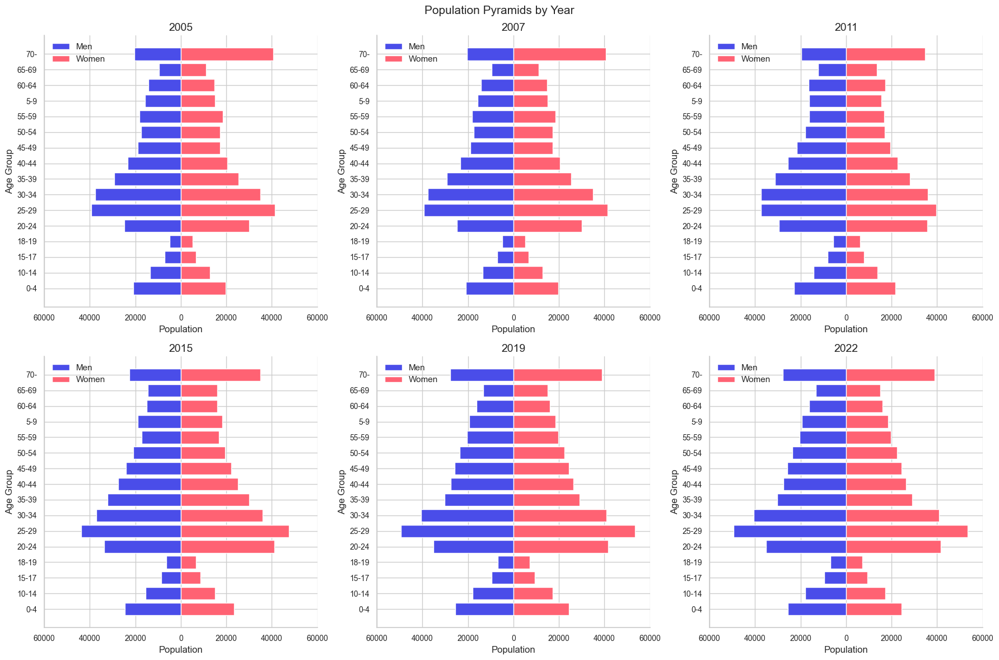

In [75]:
# Set seaborn style
sns.set(style="whitegrid")

# Age order
df_demo_long['Age'] = df_demo_long['Age'].str.replace('år', '').str.strip()
age_order = df_demo_long['Age'].unique()

# Filter data
df_demo_filtered = df_demo_long[
    df_demo_long['Gender'].isin(['Mænd', 'Kvinder']) &
    df_demo_long['Age'].isin(age_order)
]

# Color palette
color_m = '#F4A261'  # Warm orange
color_k = '#E9C46A'  # Soft yellow

color_m = theme_colors[3]  # Warm orange
color_k = theme_colors[5] # Soft yellow

# Setup subplots
years = sorted(df_demo_filtered['Year'].unique())
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18, 12))
axs = axs.flatten()

# Calculate global max population count for consistent x-axis
max_count = 0
for year in years[:6]:
    df_year = df_demo_filtered[df_demo_filtered['Year'] == year]
    pop_by_age_gender = df_year.groupby(['Age', 'Gender'])['Count'].sum().unstack().fillna(0)
    max_year = pop_by_age_gender.values.max()
    if max_year > max_count:
        max_count = max_year

#Plot each year's pyramid
for i, year in enumerate(years[:6]):
    ax = axs[i]
    df_year = df_demo_filtered[df_demo_filtered['Year'] == year]

    # Group data
    pop_by_age_gender = df_year.groupby(['Age', 'Gender'])['Count'].sum().unstack().fillna(0)
    pop_by_age_gender = pop_by_age_gender.loc[age_order]

    # Plot bars
    ax.barh(pop_by_age_gender.index, -pop_by_age_gender['Mænd'], color=color_m, label='Men')
    ax.barh(pop_by_age_gender.index, pop_by_age_gender['Kvinder'], color=color_k, label='Women')


    # Title and labels
    ax.set_title(f"{year}", fontsize=14)
    ax.set_ylabel('Age Group')
    ax.set_xlabel('Population')
    ax.set_xlim(-max_count, max_count)
    
    xticks = ax.get_xticks()
    ax.set_xticks(xticks)
    ax.set_xticklabels([f"{int(abs(label))}" for label in ax.get_xticks()])

    # Legend
    ax.legend(loc='upper left', bbox_to_anchor=(0, 1), frameon=False)

    # Clean style
    ax.spines[['right', 'top']].set_visible(False)
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)

# Hide unused subplots
for j in range(i + 1, len(axs)):
    axs[j].axis('off')

# Title and layout
plt.suptitle("Population Pyramids by Year", fontsize=15)
plt.tight_layout()
plt.subplots_adjust()
plt.show()

In [76]:
# output_notebook()

# # Lists of categories
# employment_groups = sorted(df_socio_long['EmploymentGroup'].unique())
# industries        = sorted(df_socio_long['Industry'].unique())
# years             = sorted(df_socio_long['Year'].unique())

# # Helper to aggregate counts for the selected industries
# def make_pivot(selected_industries):
#     return (
#         df_socio_long[df_socio_long['Industry'].isin(selected_industries)]
#         .groupby(['Year', 'EmploymentGroup'])['Count']
#         .sum()
#         .unstack(fill_value=0)
#         .reindex(index=years, fill_value=0)
#         .reset_index()
#         .astype({'Year': str})
#     )

# source = ColumnDataSource(make_pivot(industries))

# # Figure: grouped bars + Employment‑group legend on the right
# palette = make_palette(len(employment_groups))


# p = figure(
#     x_range=[str(y) for y in years],
#     height=400, width=900,
#     title="Employment‑group counts by Year (filterable by Industry)",
#     tools="pan,box_zoom,reset,save"
# )

# bar_w   = 0.8 / len(employment_groups)
# offsets = [-0.4 + bar_w/2 + i*bar_w for i in range(len(employment_groups))]

# for off, grp, col in zip(offsets, employment_groups, palette):
#     p.vbar(
#         x=dodge('Year', off, p.x_range),
#         top=grp,
#         width=bar_w,
#         source=source,
#         color=col,
#         legend_label=grp,
#         alpha=0.85
#     )

# p.y_range.start   = 0
# p.xaxis.axis_label = "Year"
# p.yaxis.axis_label = "Count"
# p.legend.click_policy = "hide"   

# # Move Employment‑group legend outside, on the right
# leg = p.legend[0]
# p.add_layout(leg, 'right')
# leg.orientation = "vertical"
# leg.title       = "Employment group"

# # Widget: industries ON/OFF
# checkbox = CheckboxGroup(
#     labels=industries,
#     active=list(range(len(industries))),
#     width=200,                            # keeps a tidy narrow column
# )

# checkbox.js_on_change(
#     'active',
#     CustomJS(
#         args=dict(
#             source     = source,
#             checkbox   = checkbox,
#             groups     = employment_groups,
#             all_years  = [str(y) for y in years],
#             original   = df_socio_long.to_dict('records')
#         ),
#         code="""
#             const selected = checkbox.active.map(i => checkbox.labels[i]);

#             const data = {Year: all_years.slice()};
#             for (const g of groups) { data[g] = Array(all_years.length).fill(0); }

#             for (const row of original) {
#                 if (!selected.includes(row.Industry)) { continue; }
#                 const yr  = row.Year.toString();
#                 const idx = all_years.indexOf(yr);
#                 data[row.EmploymentGroup][idx] += row.Count;
#             }

#             source.data = data;
#             source.change.emit();
#         """
#     )
# )

# show(row(checkbox, p, sizing_mode="scale_width"))

In [77]:
# # Group and aggregate
# df_total_pers = df_support_long.query("SupportType=='Total Number of Persons'").groupby('Year')['Count'].sum().reset_index()
# df_total_pers = df_total_pers.rename(columns={'Count': 'TotalPersons'})

# df_support_count = df_support_long.query("SupportType!='Total Number of Persons'").groupby(['Year', 'SupportType'])['Count'].sum().reset_index()

# df_support_ratio = pd.merge(df_support_count, df_total_pers, on='Year')
# df_support_ratio['SupportRatio'] = df_support_ratio['Count'] / df_support_ratio['TotalPersons']

# # Call the plot function
# plot_grouped_bar_dist(
#     years=df_support_ratio['Year'],
#     counts=df_support_ratio['SupportType'],
#     legend='Support Type',
#     color_map = expanded_theme_colors,
#     values=df_support_ratio['SupportRatio'],
#     html='support_type_by_year.html',
#     title='Share of Support Type Distribution by Year', 
#     show_percentage=True
# )

In [78]:
df_ownership_type_long['OwnershipType'].unique()

array(['Owner-occupied', 'Cooperative Housing', 'Public Housing',
       'Rented – Publicly Owned', 'Rented – Privately Owned',
       'Other Inhabited Dwellings'], dtype=object)

In [79]:
df_ownership_type_long

,Gruppe,KredsNr,Year,AggregateLevel,OwnershipType,Count
0,101002,1,2015,Units,Owner-occupied,6238.0
1,101009,2,2015,Units,Owner-occupied,6891.0
2,101011,3,2015,Units,Owner-occupied,4840.0
3,101019,4,2015,Units,Owner-occupied,6221.0
4,101032,7,2015,Units,Owner-occupied,11318.0
...,...,...,...,...,...,...
907,101058,5,2022,Residents,Other Inhabited Dwellings,14464.0
908,101059,6,2022,Residents,Other Inhabited Dwellings,10993.0
909,147004,10,2022,Residents,Other Inhabited Dwellings,11822.0
910,147006,11,2022,Residents,Other Inhabited Dwellings,14705.0


In [80]:
df_housing_type_long['HouseType'].unique()


array(['Detached Houses', 'Terraced and Linked Houses',
       'Multi-family Houses', 'Student Housing', 'Holiday Homes',
       'Other Dwellings'], dtype=object)

In [81]:
df_house_size_long

,Gruppe,KredsNr,Year,AggregateLevel,HouseSize,Count
0,101002,1,2015,Units,0-39m2,1884.0
1,101009,2,2015,Units,0-39m2,2509.0
2,101011,3,2015,Units,0-39m2,1305.0
3,101019,4,2015,Units,0-39m2,1408.0
4,101032,7,2015,Units,0-39m2,1370.0
...,...,...,...,...,...,...
991,101058,5,2022,Residents,200+m2,461.0
992,101059,6,2022,Residents,200+m2,541.0
993,147004,10,2022,Residents,200+m2,2527.0
994,147006,11,2022,Residents,200+m2,1120.0


In [82]:
df_house_size_long['HouseSize'].unique()

array(['0-39m2', '40-79m2', '80-119m2', '120-159m2', '160-199m2',
       '200+m2', 'Uoplystareal'], dtype=object)

## Plot Functions

In [83]:
def plot_bar_dist_per_const_multi(years, kreds_ids, values, html, const_colors, constituency_id_to_name, show_percentage=False, title="", y_axis_title=""):
    import plotly.graph_objects as go

    # Create the DataFrame
    df = pd.DataFrame({
        'Year': [str(y) for y in years],
        'KredsNr': kreds_ids,
        'Value': values})

    # Map KredsNr to name
    df['KredsName'] = df['KredsNr'].map(constituency_id_to_name)

    # Compute percentage if required
    if show_percentage:
        df['Percentage'] = df['Value'] * 100
        y_col = 'Percentage'
        text_format = '%{text:.1f}%'
        y_title = y_axis_title
    else:
        y_col = 'Value'
        text_format = '%{text:.0f}'
        y_title = y_axis_title

    # Create traces for each Kreds
    kreds_info = df[['KredsNr', 'KredsName']].drop_duplicates().sort_values('KredsNr')
    kreds_list = list(zip(kreds_info['KredsNr'], kreds_info['KredsName']))

    fig = go.Figure()

    for kreds_nr, kreds_name in kreds_list:
        kreds_df = df[df['KredsName'] == kreds_name]

        fig.add_trace(
            go.Bar(
                x=kreds_df['Year'],
                y=kreds_df[y_col],
                name=kreds_name,
                text=kreds_df[y_col],
                marker_color=const_colors[kreds_name],
                texttemplate=text_format,
                textposition='inside',
                visible=True, 
                hovertemplate=(
                    f"<b>{kreds_name}</b><br>" +
                    f"{'Percentage' if show_percentage else 'Count'}: %{{y:.2f}}<extra></extra>")
            )
        )

    fig.update_layout(
        title=dict(
            text=title,
            x=0.5, 
            font=dict(
                family="Arial",  
                size=20,         
                color="black")),
        barmode='group',
        uniformtext_minsize=8,
        uniformtext_mode='hide',
        hovermode="x unified",
        plot_bgcolor='rgba(0,0,0,0)',
        yaxis_title=y_title,
        xaxis_title="Election Year",
        font=dict(
            family="Arial",
            size=12, 
            color="black"),
        legend=dict(
            title_font_family="Arial",
            font=dict(size=12),
            bordercolor="Black",
            borderwidth=1,
            orientation="v",  
            traceorder="normal")
    )

    fig.update_xaxes(showline=True, linewidth=1, linecolor='lightgrey',
                     showgrid=True, gridwidth=1, gridcolor='lightgrey')
    fig.update_yaxes(showline=True, linewidth=1, linecolor='lightgrey',
                     showgrid=True, gridwidth=1, gridcolor='lightgrey')

    fig.write_html(html)
    fig.show()


In [84]:
def plot_stacked_bar_dist_per_const(years, kreds_ids, counts, legend, values, html, color_map, constituency_id_to_name, show_percentage=False, title="", y_title=""):
    import plotly.graph_objects as go
    
    # Create DataFrame
    df = pd.DataFrame({
        'Year': years,
        'KredsNr': kreds_ids,
        f'{legend}': counts,
        'Value': values})

    # Map KredsNr to KredsName
    df['KredsName'] = df['KredsNr'].map(constituency_id_to_name)

    # Convert years to string for categorical x-axis
    df['Year'] = df['Year'].astype(str)
    df[f'{legend}'] = df[f'{legend}'].astype(str)

    # Compute percentage if needed
    if show_percentage:
        df['Percentage'] = df['Value'] * 100
        y_col = 'Percentage'
        text_format = '%{text:.1f}%'
        y_title = y_title
    else:
        y_col = 'Value'
        text_format = '%{text:.0f}'
        y_title = y_title

    # Get sorted list of (KredsNr, KredsName)
    kreds_info = df[['KredsNr', 'KredsName']].drop_duplicates().sort_values('KredsNr')
    kreds_list = list(zip(kreds_info['KredsNr'], kreds_info['KredsName']))

    fig = go.Figure()

    # Category list : parties 
    all_categories = sorted(df[legend].unique())

    # Create traces for each (KredsName, Category) combination
    for kreds_nr, kreds_name in kreds_list:
        kreds_df = df[df['KredsName'] == kreds_name]

        for cat in all_categories:
            cat_df = kreds_df[kreds_df[legend] == cat]

            fig.add_trace(
                go.Bar(
                    x=cat_df['Year'],
                    y=cat_df[y_col],
                    name=cat, 
                    legendgroup=cat,  
                    marker_color=color_map.get(cat, '#333333'),
                    text=cat_df[y_col],
                    texttemplate=text_format,
                    textposition='inside',
                    visible=(kreds_name == 'Østerbro'),  
                    hovertemplate=(
                    f"<b>{cat}</b><br>" +
                    f"{'Percentage' if show_percentage else 'Count'}: %{{y:.2f}}<extra></extra>")
                )
            )

    # Checklist (checkbox-style menu)
    num_categories = len(all_categories)
    kreds_names_only = [k for _, k in kreds_list]

    buttons = []
    for i, kreds_name in enumerate(kreds_names_only):
        visible = [False] * len(fig.data)
        start_idx = i * num_categories

        for j in range(num_categories):
            visible[start_idx + j] = True

        buttons.append(dict(
            label=kreds_name,
            method="update",
            args=[
                {"visible": visible},
                {"title": f"{title}<br>({kreds_name})"}  
            ]
        ))
    default = kreds_names_only[0]
    fig.update_layout(
        updatemenus=[
            dict(
                type="dropdown",
                buttons=buttons,
                x=1.05,  
                y=1.25, 
                active=0,  
                showactive=True,
                bgcolor="white",
                bordercolor="black",
                borderwidth=0.5,
                font=dict(size=12),
                direction="down"
            )
        ],
        title=dict(
            text=f"{title}<br>({default})",  
            x=0.5, 
            font=dict(
                family="Arial",  
                size=20,         
                color="black")),
        barmode='stack',
        uniformtext_minsize=8,
        uniformtext_mode='hide',
        hovermode="x unified",
        plot_bgcolor='rgba(0,0,0,0)',
        yaxis_title=y_title,
        xaxis_title="Election Year",
        font=dict(
            family="Arial",
            size=12, 
            color="black"),
        showlegend=True,
        legend_title_text=legend,
        legend=dict(
            title_font_family="Arial",
            font=dict(size=12))
    )

    fig.update_xaxes(showline=True, linewidth=1, linecolor='lightgrey',
                     showgrid=True, gridwidth=1, gridcolor='lightgrey')
    fig.update_yaxes(showline=True, linewidth=1, linecolor='lightgrey',
                     showgrid=True, gridwidth=1, gridcolor='lightgrey')

    fig.write_html(html)
    fig.show()

<a id="3"></a>
## 3.  Data Analysis


### 3.1 Election exploration

The first step in our analysis is to explore the election data. We will investigate how the patterns and trends of voting in Copenhagen have changed over the past two decades. In the **Basic Statistics** section, we already examined voter turnout in each election year and the share of wings (left and right) in the elections. This provided a good overview of basic voting behavior in Copenhagen, showing that turnout has been steady over the years, with increases in 2007 and 2011, and generally hovering around 84%. Regarding the wing share, we observed that the left wing has dominated the elections in Copenhagen, with a slight increase over the years. However, the last election in 2022 showed a decrease in the left-wing share, highlighting how the 2022 election was characterized by the rise of centrist parties.

Now, we will take a closer look at voting behavior in Copenhagen by examining how it has evolved across different constituencies over the years.

#### 3.1.1 Vote turnout across constituencies
First, we would like to explore the voting turnout futher, now by constituency. We will analyze how the voting turnout has changed over the years in each constituency. This will help us understand whether there are any significant differences in voting behavior across different areas of Copenhagen.

In [85]:
# Total number of people who actually voted, per year and constituency
df_voter_turnout_const = df_elec_cph_long.query("Partyname == 'Afgivnestemmer'").groupby(['Year', 'KredsNr']).agg(TotalVotesCast=('Votes', 'sum')).reset_index()

# Total number of people who were eligible to vote, per year and constituency
df_voter_eligibility_const = df_elec_cph_long.query("Partyname == 'Stemmeberettigede'").groupby(['Year', 'KredsNr']).agg(TotalEligibleVoters=('Votes', 'sum')).reset_index()

# Voter turnout ratio = votes cast / eligible voters
df_turnout_ratio_const = pd.DataFrame(df_voter_turnout_const[['Year', 'KredsNr']].copy())
df_turnout_ratio_const['TurnoutRatio'] = df_voter_turnout_const['TotalVotesCast'] / df_voter_eligibility_const['TotalEligibleVoters']

In [86]:
plot_bar_dist_per_const_multi(
    years=df_turnout_ratio_const['Year'].values,
    kreds_ids=df_turnout_ratio_const['KredsNr'].values,
    values=df_turnout_ratio_const['TurnoutRatio'].values,
    const_colors=const_colors,
    html="html_plots/vote_turnout_const.html",
    constituency_id_to_name=constituency_id_to_name,
    show_percentage=True,
    title="Voter Turnout in Copenhagen Constituencies (2005–2022)", 
    y_axis_title="Voter Turnout (%)"
)

The figure above shows the voting turnout in each constituency for the election years over the past two decades. We observe that the constituency *Bispebjerg* has the lowest turnout across all the elections. Furthermore, we observe that the constituency *Falkoner* has the highest turnout across all the elections. These findings are interesting when later investigating the population data to see if there are any clear patterns explaining why the populations in these constituencies exhibit different voting behavior.

#### 3.1.2 Wing share across constituencies
*Did left-wing rise? Did right-wing wane?*

Now we will take a look at the share of left and right-wing parties in each constituency. This will help us understand how the political landscape has changed over the years in Copenhagen.

In [87]:
# Get total voters per year and constituency
df_total_voters_const = df_elec_cph_parties.groupby(['Year', 'KredsNr'])['Votes'].sum().reset_index()
df_total_voters_const = df_total_voters_const.rename(columns={'Votes': 'TotalVotes'})

# Get vote sum per wing per year per constituency
df_wing_sum_const = df_elec_cph_parties.groupby(['Year', 'Wing', 'KredsNr'])['Votes'].sum().reset_index()

# Merge and compute wing ratio
df_wing_const_ratio = pd.merge(df_wing_sum_const, df_total_voters_const, on=['Year', 'KredsNr'])
df_wing_const_ratio['WingRatio'] = df_wing_const_ratio['Votes'] / df_wing_const_ratio['TotalVotes']

In [88]:
plot_stacked_bar_dist_per_const(
    years=df_wing_const_ratio['Year'].values,
    kreds_ids=df_wing_const_ratio['KredsNr'].values,
    counts=df_wing_const_ratio['Wing'].values, 
    legend='Wing',            
    values=df_wing_const_ratio['WingRatio'].values,
    html="html_plots/wing_share_votes_const.html",
    color_map=wing_colors,       
    constituency_id_to_name=constituency_id_to_name,
    show_percentage=True,
    title="Wing Share across Constituency (2005-2022)",
    y_title="Wing Share (%)"
)


This figure shows the share of left- and right-wing parties in each constituency for the election years over the past two decades.

We previously observed that left-wing parties have dominated the elections in Copenhagen, with a slight increase in support over the years. However, we now see that right-wing parties have gained ground in certain constituencies, particularly in *Tårnby*, *Falkoner*, and *Slotskredsen*.

Several constituencies, such as *Nørrebro*, *Bispebjerg*, *Vesterbro*, and *Indre By*, maintain a clear left-wing majority. In contrast, constituencies like Tårnby display a more balanced distribution between left- and right-wing parties, only shifting to a left-wing majority in 2019 and 2022 — though it remains relatively balanced.

Overall, we observe a shift in Copenhagen's political landscape, with some constituencies becoming more competitive between left- and right-wing parties.

Let us now visualize the political share in a different way. We will create a map of Copenhagen to show the distribution of left- and right-wing party support in each constituency for the election years over the past two decades.

Constituencies will be colored based on the share of left-wing support, using a blend of the left- and right-wing colors. A perfect purple color will indicate an even split — 50% left-wing and 50% right-wing. A pure blue color will represent 100% support for left-wing parties, while a pure red color will represent 100% support for right-wing parties.

In [89]:
df_wing_const_ratio['Votes (%)'] = df_wing_const_ratio['WingRatio'] * 100

df_pivot_wing_freq = df_wing_const_ratio.pivot_table(
    index=["Year", "KredsNr"],
    columns="Wing",
    values="Votes (%)",
    fill_value=0
).reset_index()

df_pivot_wing_freq["pct_left"] = df_pivot_wing_freq["Left"] / (df_pivot_wing_freq["Right"] + df_pivot_wing_freq["Left"])
df_pivot_wing_freq["pct_right"] = df_pivot_wing_freq["Right"] / (df_pivot_wing_freq["Right"] + df_pivot_wing_freq["Left"])

In [90]:
def blend_red_blue(pct_right):
    pct_right = min(max(pct_right, 0), 1)  # Clamp
    r = int((1 - pct_right) * 255)
    g = 0
    b = int(pct_right * 255)
    return f"#{r:02x}{g:02x}{b:02x}"

In [91]:
geojson_folder = "Data/CopenhagenGeoData"

m = folium.Map(location=[55.6461, 12.5683], zoom_start=12, tiles=None)
folium.TileLayer("cartodbpositron", name=None, control=False).add_to(m)

for year in sorted(df_pivot_wing_freq["Year"].unique()):
    fg = folium.map.FeatureGroup(name=str(year), overlay=False)

    df_year = df_pivot_wing_freq[df_pivot_wing_freq["Year"] == year]
    
    for _, row in df_year.iterrows():
        kreds_nr   = row["KredsNr"]
        kreds_name = constituency_id_to_name.get(kreds_nr)

        pct_right  = row["pct_right"]
        pct_left   = row["pct_left"]
        fill_color = blend_red_blue(pct_right)

        geojson_path = os.path.join(geojson_folder, f"{kreds_name}.json")
        with open(geojson_path, encoding="utf-8") as f:
            geojson = json.load(f)

        tooltip_html = f"""
            <div style='background:white;color:black;padding:6px 8px;border-radius:0;text-align:center;'>
            <b>{kreds_name}</b><br>{round(pct_left*100)} % left
            </div>
            """
        # build the feature
        gj = folium.GeoJson(
            data=geojson,
            name=f"{kreds_name}_{year}",
            style_function=lambda _, c=fill_color: {
                "fillColor": c,
                "color": "black",
                "weight": 1,
                "fillOpacity": 1,
            },
            tooltip = folium.Tooltip(tooltip_html, sticky=True, parse_html=True)
        )
        gj.add_to(fg)
        
    fg.add_to(m)

folium.LayerControl(collapsed=False).add_to(m)

m.save("html_plots/map_wing_share.html")

In [92]:
m

This map provides a clear visual representation of the political landscape in Copenhagen, allowing us to observe how support for left- and right-wing parties has changed over the years.

One key observation is how the Tårnby constituency has become more balanced over time. In 2005 and 2007, it displayed a darker purple color, indicating a more right-wing support. In more recent years, however, the purple has shifted slightly toward red, suggesting a modest increase in left-wing support — although Tårnby still remains more balanced than most other constituencies.

Overall, the map clearly shows which constituencies are predominantly left- or right-wing and how these dynamics have evolved. Constituencies like Falkoner and Slotskredsen appear more purple than others, reflecting a more even distribution between left- and right-wing parties. In contrast, Nørrebro and Bispebjerg are noticeably more red, indicating a strong left-wing dominance.

When browsing through the election years, a broader trend becomes apparent: Copenhagen as a whole has shifted toward greater left-wing support over time. However, the 2022 election marks a slight reversal, with constituencies appearing more purple compared to previous years, signaling a relative decline in left-wing dominance and hightlight the trend for the 2022 election that was characterized by the rise of centrist parties.

#### 3.1.3 Party support across constituencies

Now we will take a look at the support for individual parties in each constituency. This will help us understand how the support for different parties has changed over the years in Copenhagen.

In [93]:
# Drop the rows where the parties get 0 votes (meaning they are not in the election)
df_elec_cph_parties = df_elec_cph_parties.drop(df_elec_cph_parties[df_elec_cph_parties['Votes'] == 0].index)

# Total votes by Year & Party
df_party_votes = (df_elec_cph_parties.groupby(['Year','Partyname'], as_index=False)['Votes'].sum())

# Total votes per Year (for share calculation)
df_year_total = (df_party_votes.groupby('Year', as_index=False)['Votes'].sum().rename(columns={'Votes':'YearTotal'}))

# Calculate share
df_party_votes = df_party_votes.merge(df_year_total, on='Year')
df_party_votes['VoteShare'] = df_party_votes['Votes'] / df_party_votes['YearTotal']

In [94]:
fig = px.line(df_party_votes,
    x='Year',
    y='VoteShare',
    color='Partyname',
    markers=True,
    title='Vote Share per Party Over Time (2005-2022)',
    labels={'VoteShare':'Vote Share (%)','Year':'Election Year'}, 
    color_discrete_map=party_colors 
)


years = sorted(df_party_votes['Year'].unique())
fig.update_xaxes(
    tickmode='array',
    tickvals=years,
    ticktext=[str(y) for y in years])

fig.update_layout(
    title=dict(
        text='Vote Share by Party Over Time (2005-2022)',
        x=0.5, 
        font=dict(
            family="Arial",  
            size=20,         
            color="black")),
    font=dict(
        family="Arial",
        size=12, 
        color="black"),
    yaxis_tickformat='.0%',
    hovermode='x unified', 
    legend_title_text='Party',
    legend=dict(
            title_font_family="Arial",
            font=dict(size=12),
            orientation="v",  
            traceorder="normal")
)

fig.update_traces(
    hovertemplate='%{fullData.name}: %{y:.1%}<extra></extra>'
)

fig.write_html("html_plots/vote_share_per_party.html")
fig.show()

This figure shows the share of votes for each party across the election years over the past two decades.

We observe that the *Socialdemokratiet* party has consistently received the highest share of votes across all years. However, in 2019, they only received slightly more votes than *Enhedslisten*, which is perhaps not surprising, as the 2019 election was dominated by green transition issues.

It is particularly interesting to see how *Enhedslisten* has developed over the years, becoming one of the most popular parties in Copenhagen. In 2005, they received only 8.8% of the votes, but by 2019, they had doubled their share.

*Radikale Venstre* also shows an interesting pattern, with varying trends across the elections. In some years, such as 2005, 2011, and 2019, they were very popular and secured a significant share of the votes. It seems evident that their popularity peaks roughly every second election.

For the right-wing parties, *Venstre* stands out as the most popular. Their vote share ranged between 17.1% and 8.4% over the years. The further drop in 2022 can likely be explained by the emergence of the new party *Moderaterne*, founded in 2021 by former Venstre chairman Lars Løkke Rasmussen.

Finally, we notice the significant decline of *Dansk Folkeparti*. In 2001, they received 11.1% of the votes, peaking at 11.5% in 2015, but by 2022, they only secured 1.6%. This dramatic fall highlights their declining popularity, possibly influenced by the rise of new right-wing extremist parties.

Now, we will take a closer look at the support for individual parties in each constituency. This will help us better understand how party support has changed over the years across Copenhagen.

For simplicity, we will focus only on the top parties. These are defined as the five parties that received the most votes in each constituency in each election year. By doing so, we can concentrate on the most relevant parties and their support trends. This approach means that for each constituency and each election year, we select the top five parties. The set of all these parties are used for the analysis.

In [95]:
# Calculate vote percentages per party, per year, per district
df_party_freq = (
    df_elec_cph_parties.groupby(['Year', 'Partyname', 'KredsNr'])['Votes'].sum()
    / df_elec_cph_parties.groupby(['Year', 'KredsNr'])['Votes'].sum()
    * 100
).reset_index().rename(columns={'Votes': 'Votes (%)'}).round(2)

# Filter top 5 parties per district per year
top_parties_per_district_year = (
    df_party_freq
    .sort_values(['Year', 'KredsNr', 'Votes (%)'], ascending=[True, True, False])
    .groupby(['Year', 'KredsNr'])
    .head(5))

df_top5_party_freq = df_party_freq[df_party_freq['Partyname'].isin(top_parties_per_district_year['Partyname'])].reset_index(drop=True)

print(f"The top parties: \n {df_top5_party_freq['Partyname'].unique()}")


The top parties: 
 ['A.Socialdemokratiet' 'B.DetRadikaleVenstre'
 'C.DetKonservativeFolkeparti' 'F.SF-SocialistiskFolkeparti'
 'O.DanskFolkeparti' 'V.Venstre,DanmarksLiberaleParti'
 'Ø.Enhedslisten-DeRød-Grønne' 'I.LiberalAlliance' 'Å.Alternativet'
 'M.Moderaterne']


In [96]:
from bokeh.models import Checkbox

In [97]:
output_notebook()

alpha_step = 0.3

# === prepare data ===
df = df_top5_party_freq.copy()
df['Year'] = df['Year'].astype(str)
idxs    = sorted(df['KredsNr'].unique(), key=int)
parties = sorted(df['Partyname'].unique())
names   = [constituency_id_to_name[i] for i in idxs]

all_data = {}
for num, name in zip(idxs, names):
    sub  = df[df['KredsNr']==num]
    wide = (
        sub
        .pivot(index='Year', columns='Partyname', values='Votes (%)')
        .fillna(0)
        .reset_index()
    )
    all_data[name] = {
        'Year': wide['Year'].tolist(),
        **{p: wide[p].tolist() for p in parties}
    }

# === figure + theme ===
curdoc().theme = Theme(json={
    'attrs': {
      'Axis': {
        'axis_label_text_font': 'Arial',
        'axis_label_text_font_size': '12px',
        'major_label_text_font': 'Arial',
        'axis_label_text_font_style': 'normal',
        'major_label_text_font_style': 'normal', 
        'axis_label_text_color': 'black',
        'major_label_text_color': 'black'
      },
      'Title': {
        'text_font': 'Arial',
        'text_font_size': '20px',
        'align': 'center',
        'text_color': 'black'
      }
    }
})

years     = sorted(df['Year'].unique())
bar_width = 0.8 / len(parties)
offsets   = np.linspace(-0.4 + bar_width/2, 0.4 - bar_width/2, len(parties))

p = figure(
    x_range=FactorRange(*years, range_padding=0.02),
    height=400, width=1200,
    title="Vote Share over 20 Years in Copenhagen Constituencies",
    toolbar_location=None, tools=""
)
p.xaxis.axis_label = "Election Year"
p.yaxis.axis_label = "Vote Share (%)"

# === draw overlays ===
party_renderers = {party: [] for party in parties}

for layer, (num, name) in enumerate(zip(idxs, names)):
    sub = df[df['KredsNr'] == num]

    alpha   = max(0.1, 1 - layer*alpha_step)
    visible = (layer == 0)

    for i, party in enumerate(parties):
        # --- build a tiny DataFrame for just ONE party --------------
        tmp = (
            sub[sub['Partyname'] == party]
            .pivot(index='Year', columns='Partyname', values='Votes (%)')
            .fillna(0)
            .reset_index()
        )
        src = ColumnDataSource({
            'Year'        : tmp['Year'].astype(str),
            'Constituency': [name] * len(tmp),
            'Party'       : [party] * len(tmp),
            'VoteShare'   : tmp[party],
        })

        # --- draw the bar ------------------------------------------
        r = p.vbar(
            x=dodge('Year', offsets[i], range=p.x_range),
            top='VoteShare',
            width=bar_width,
            source=src,

            fill_color = party_colors.get(party, "#333333"),
            fill_alpha = alpha,
            line_color = None,

            name   = f'overlay_{name}',   # legend & alpha logic rely on this
            tags   = [name],              # ← *** ADD THIS LINE ***
            visible= visible,
        )

        party_renderers[party].append(r)


# ---------------------------------------------------------------------
# 3.  Single hover tool (works for every bar, every year)
# ---------------------------------------------------------------------
hover = HoverTool(
    mode="vline",
    renderers=[r for plist in party_renderers.values() for r in plist],
    tooltips=[
        ("Constituency", "@Constituency"),
        ("Year",         "@Year"),
        ("Party",        "@Party"),
        ("Vote share",   "@VoteShare{0.0}%"),
    ],
)
p.add_tools(hover)

legend = Legend(
    items=[LegendItem(label=party, renderers=party_renderers[party])
           for party in parties],
    label_text_font="Arial",
    label_text_font_size="12px",
)
p.add_layout(legend, 'right')

# ---------------------------------------------------------------------
# 4.  Checkbox callback: look at r.tags[0] instead of r.name
# ---------------------------------------------------------------------
checkbox = CheckboxGroup(
    labels=names,   # names is your list of constituency names
    active=[0],     # initially select the first constituency
)
callback = CustomJS(
    args=dict(plot=p, names=names, alpha_step=alpha_step),
    code="""
        const active = cb_obj.active;
        plot.renderers.forEach(r => {
            if (!r.name || !r.name.startsWith('overlay_')) return;

            const cname = r.name.slice(8);          // strip "overlay_"
            const idx   = names.indexOf(cname);
            const sel   = active.indexOf(idx);

            r.visible = sel >= 0;
            if (r.visible)
                r.glyph.fill_alpha = Math.max(0.1, 1 - sel * alpha_step);
        });
    """
)
checkbox.js_on_change('active', callback)

output_file("html_plots/party_vote_share_const.html", title="Vote Share over 20 Years")

show(bokeh_row(checkbox, p))


Loading BokehJS ...

In [98]:
import plotly.graph_objects as go
import numpy as np

# ---------- figure ----------------------------------------------------
fig = go.Figure()

n_parties = len(parties)
n_traces_per_const = n_parties          # handy later

for c_idx, (num, cname) in enumerate(zip(idxs, names)):
    sub = df[df['KredsNr'] == num]

    for party in parties:
        tmp = (
            sub[sub['Partyname'] == party]
            .pivot(index='Year', columns='Partyname', values='Votes (%)')
            .fillna(0)
            .reset_index()
        )

        fig.add_trace(
            go.Bar(
                x=tmp['Year'],
                y=tmp[party],
                name=party,                     # legend shows only party names
                marker_color=party_colors.get(party, "#333333"),
                visible=(c_idx == 0),          # show **only** the first constituency at start
                offsetgroup=party,
                legendgroup=party,
                hovertemplate=(
                    f"<b>{cname}</b><br>"
                    "Year: %{x}<br>"
                    f"Party: {party}<br>"
                    "Vote share: %{y:.1f}%<extra></extra>"
                )
            )
        )

# ---------- dropdown buttons ------------------------------------------
buttons = []
for c_idx, cname in enumerate(names):
    # build a boolean mask: True for traces belonging to this constituency
    vis = (
        [False]*n_traces_per_const*c_idx +
        [True]*n_traces_per_const +
        [False]*n_traces_per_const*(len(names)-c_idx-1)
    )
    buttons.append(
        dict(
            label=cname,
            method="update",
            args=[{"visible": vis},
                  {"title": f"Vote Share in {cname}"}]
        )
    )

fig.update_layout(
    title=f"Vote Share in {names[0]}",
    xaxis_title="Election Year",
    yaxis_title="Vote Share (%)",
    barmode="group",
    bargap=0.15,
    bargroupgap=0.04,
    width=1200,
    height=400,
    font=dict(family="Arial"),
    updatemenus=[dict(
        buttons=buttons,
        direction="down",
        x=1.02, xanchor="left",
        y=1.2, yanchor="top",
        showactive=True
    )],
    legend=dict(title="Party", font_size=12)
)

fig.show()


This figure allows us to explore the support for individual parties in each constituency over the past two decades.

First, we observe that there are a total of 10 different parties that have appeared among the top five most popular parties across the constituencies. For example, *Moderaterne* and *Liberal Alliance* are only present in the most recent election, as they are relatively new parties.

In the *Østerbro* constituency, we see that while *Socialdemokratiet* has generally been among the most popular parties, it has not always been the winning party. In both 2011 and 2019, *Radikale Venstre* received the most votes. A similar pattern is observed in *Indre By*, where *Radikale Venstre* was the most popular party in 2005, 2011, and 2019, while *Socialistisk Folkeparti* led in 2007.

In *Nørrebro*, we observe that *Enhedslisten* has been the most popular party since 2011. Interestingly, in 2015, *Alternativet* received more votes than *Socialdemokratiet*. In fact, *Socialdemokratiet* has never been the leading party in *Nørrebro*.

It is also noteworthy how the *Falkoner*, *Slotskredsen*, and *Tårnby* constituencies exhibit different voting behavior compared to the others. In these areas, several right-wing parties — such as *Venstre*, *Dansk Folkeparti*, *Liberal Alliance*, and *Konservative Folkeparti* — have been among the most popular.

Now let us visualize the winning party in each constituency for each election year in a map, this will easier give us an overview of the winning party in each constituency.

In [99]:
df_winning_party_const = df_party_freq.loc[
    df_party_freq.groupby(['Year', 'KredsNr'])['Votes (%)'].idxmax()
].reset_index(drop=True)


geojson_folder = "Data/CopenhagenGeoData"

m_winning_party = folium.Map(location=[55.6461, 12.5683], zoom_start=12, tiles=None)
folium.TileLayer("cartodbpositron", name=None, control=False).add_to(m_winning_party)

# Loop over years
for year in sorted(df_winning_party_const["Year"].unique()):
    fg = folium.map.FeatureGroup(name=str(year), overlay=False)

    df_year = df_winning_party_const[df_winning_party_const["Year"] == year]
    
    for _, row in df_year.iterrows():
        kreds_nr   = row["KredsNr"]
        kreds_name = constituency_id_to_name.get(kreds_nr)
        party_name = row["Partyname"]

        # Get party color
        fill_color = party_colors.get(party_name, "#cccccc")  # default grey if party not in dict

        geojson_path = os.path.join(geojson_folder, f"{kreds_name}.json")
        if not os.path.exists(geojson_path):
            continue  # skip if geojson not found

        with open(geojson_path, encoding="utf-8") as f:
            geojson = json.load(f)

        tooltip_html = f"""
            <div style='background:white;color:black;padding:6px 8px;border-radius:0;text-align:center;'>
            <b>{kreds_name}</b><br>Winning party: {party_name}
            <br>Votes: {row["Votes (%)"]} %
            </div>
            """

        # build the feature
        gj = folium.GeoJson(
            data=geojson,
            name=f"{kreds_name}_{year}",
            style_function=lambda _, c=fill_color: {
                "fillColor": c,
                "color": "black",
                "weight": 1,
                "fillOpacity": 1,
            },
            tooltip=folium.Tooltip(tooltip_html, sticky=True, parse_html=True),
        )
        gj.add_to(fg)
        
    fg.add_to(m_winning_party)

folium.LayerControl(collapsed=False).add_to(m_winning_party)

m_winning_party.save("html_plots/map_winning_party.html")


In [100]:
m_winning_party

The map above shows the winning party in each constituency for each election year over the past two decades. The constituencies are colored based on the winning party, with different colors representing different parties.

In 2005, we see that *Socialdemokratiet* was the winning party in most constituencies, while *Radikale Venstre* won in a few constituencies, including *Nørrebro*, *Indre By*, and *Falkoner*. 

In 2007, *Socialistisk Folkeparti* became the winning party in *Nørrebro*, *Indre By*, and *Vesterbro*, while *Socialdemokratiet* regained *Falkoner*. 

In 2011, the distribution of winning parties became more diverse. Notably, *Venstre* won in *Tårnby* and *Slotskredsen*, while in central Copenhagen, both *Radikale Venstre* and *Enhedslisten* won in different constituencies.

In 2015, *Socialdemokratiet* dominated, winning most constituencies, with *Enhedslisten* securing *Nørrebro* and *Vesterbro*.

In 2019, *Radikale Venstre* won in *Indre By*, *Falkoner*, and *Østerbro*, where Venstre won *Slot*, and Enhhedslisten won in *Nørrebro*, *Bispebjerg* and *Vesterbro*. 

In the most recent election, 2022, *Socialdemokratiet* maintained dominance across most constituencies, while *Enhedslisten* won in several areas, including *Nørrebro*, *Bispebjerg*, *Indre By*, and *Vesterbro*.


In [101]:
output_notebook()

# fraction of the category width you want bars to fill (0–1)
cluster_fill = 1
# padding between full categories (0 = none, up to ~0.2)
category_padding = 0.2

# Ensure Year is categorical
df_top5 = df_top5_party_freq.copy()
df_top5['Year'] = df_top5['Year'].astype(str)

# Unique sorted lists
constituency_idx = sorted(df_top5['KredsNr'].unique(), key=int)
parties    = sorted(df_top5['Partyname'].unique())

# Build a JS-serializable dict of all data
all_data = {}
for const_num in constituency_idx:
    dfk = df_top5[df_top5['KredsNr']==const_num]
    wide = dfk.pivot(index='Year', columns='Partyname', values='Votes (%)').fillna(0)
    # ensure every party column exists
    for p in parties:
        if p not in wide: wide[p] = 0
    wide = wide.reset_index()
    all_data[constituency_id_to_name[const_num]] = { 'Year': wide['Year'].tolist(),
                          **{p: wide[p].tolist() for p in parties} }

# Initial data source
src = ColumnDataSource(data=all_data[constituency_id_to_name[constituency_idx[0]]])

# Set up figure
p = figure(x_range=sorted(df_top5['Year'].unique()),
           height=400, width=1500,
           title=constituency_id_to_name[constituency_idx[0]],
           toolbar_location='right', tools="")

# draw one vbar per party, dodged
legend_items = []
offsets = np.linspace(-0.3, 0.3, len(parties))
for party, off in zip(parties, offsets):
    bar = p.vbar(
        x=dodge('Year', off, range=p.x_range),
        top=party, width=0.05,
        source=src,
        color=party_colors.get(party, "#333333"),
    )
    legend_items.append(LegendItem(label=party, renderers=[bar]))

# External legend object
external_legend = Legend(
    items=legend_items,
    label_text_font_size="10pt",
    click_policy="hide"
)

# Add legend outside the plot frame (right)
p.add_layout(external_legend, 'right')

p.xaxis.axis_label = "Year"
p.yaxis.axis_label = "Votes (%)"

# # Dropdown widget
# select = Select(title="Constituency", value=constituency_id_to_name[constituency_idx[0]],
#                 options=[constituency_id_to_name[const_idx] for const_idx in constituency_idx])


from bokeh.models import CheckboxGroup, CustomJS

# the labels you already built
labels = [constituency_id_to_name[i] for i in constituency_idx]

# create a CheckboxGroup with all options, but only the first one active initially
checkbox = CheckboxGroup(
    labels=labels,
    active=[0],       # start with the first constituency selected
    width=100,        # a narrow column
    height=300        # optional: show more entries without scrolling
)

# JS callback to enforce single‐selection and update the chart
callback = CustomJS(
    args=dict(src=src, all_data=all_data, plot=p, labels=labels),
    code="""
        // cb_obj.active is the list of checked indices
        let act = cb_obj.active;
        // if more than one, keep only the last‐clicked
        if (act.length > 1) {
            const last = act[act.length - 1];
            cb_obj.active = [last];
            act = cb_obj.active;
        }
        // now act[0] is the index we want
        const idx  = act[0];
        const name = labels[idx];
        // swap in the new data and title
        src.data = all_data[name];
        plot.title.text = name;
        src.change.emit();
    """
)

# wire up the callback
checkbox.js_on_change('active', callback)

# and finally lay it out
# show(column(checkbox, p))
show(bokeh_row(checkbox, p))

# save bokeh plot
output_file("html_plots/vote_share_copenhagen.html", title="Vote Share over 20 Years")


Loading BokehJS ...